This code is to valdiate MIRCA-OS aganst the orgional MIRCA2000 on apixle level agrement and disagrement.

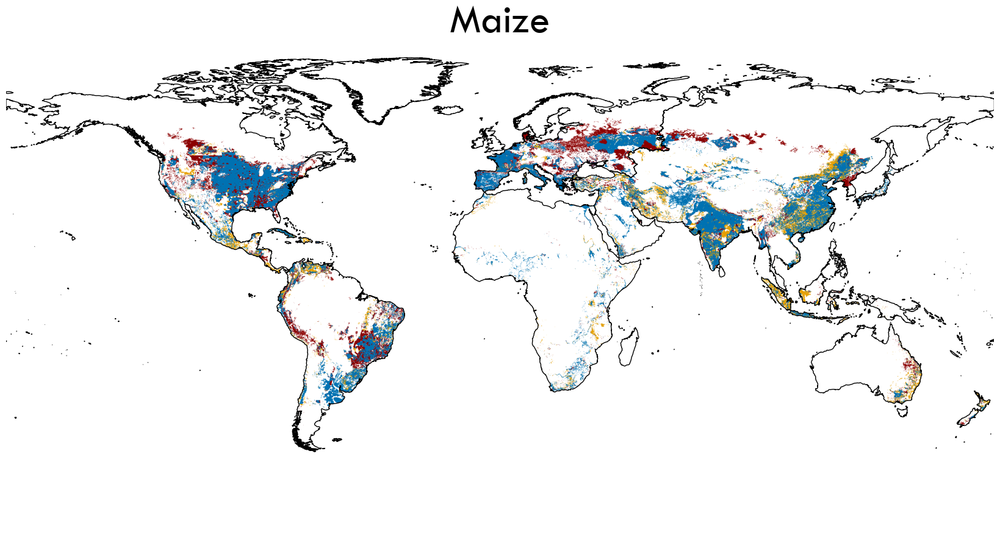

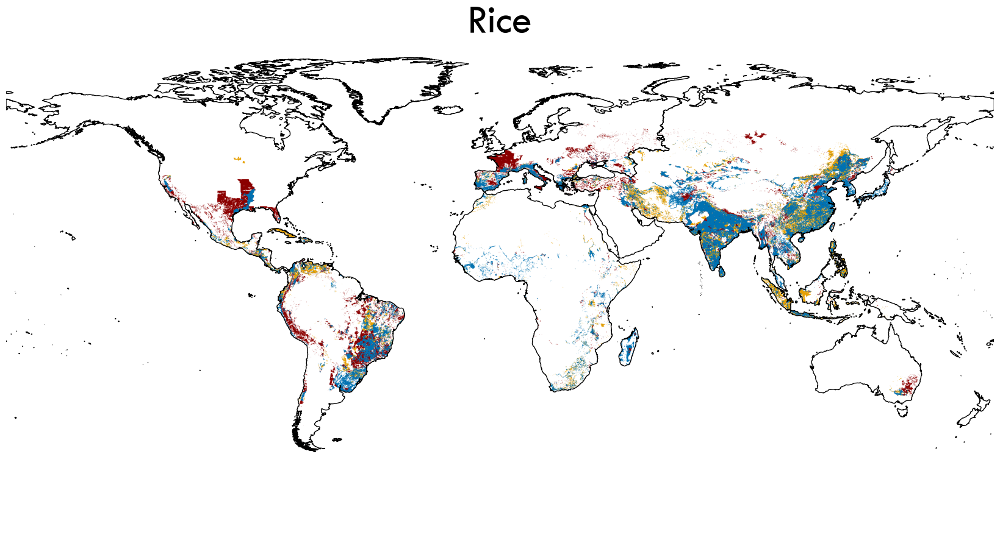

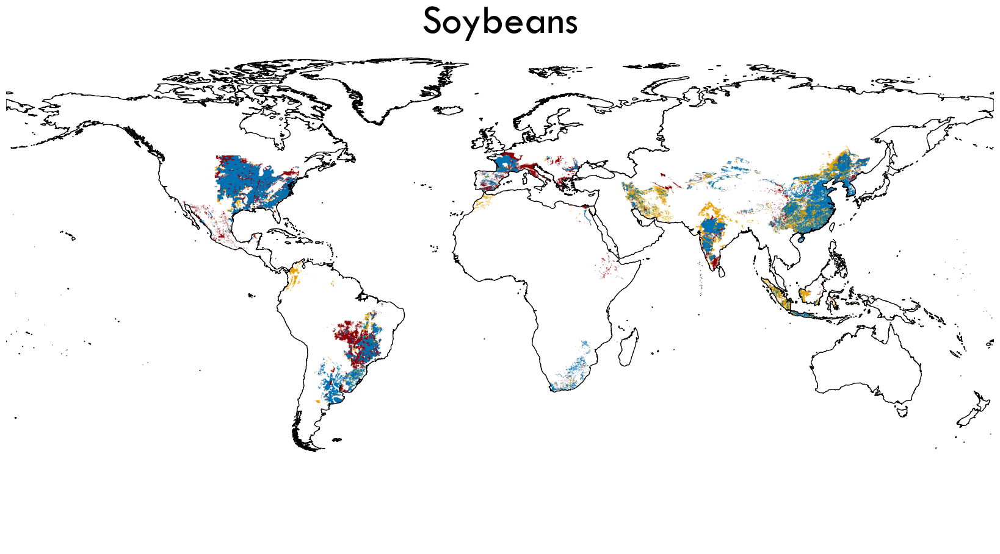

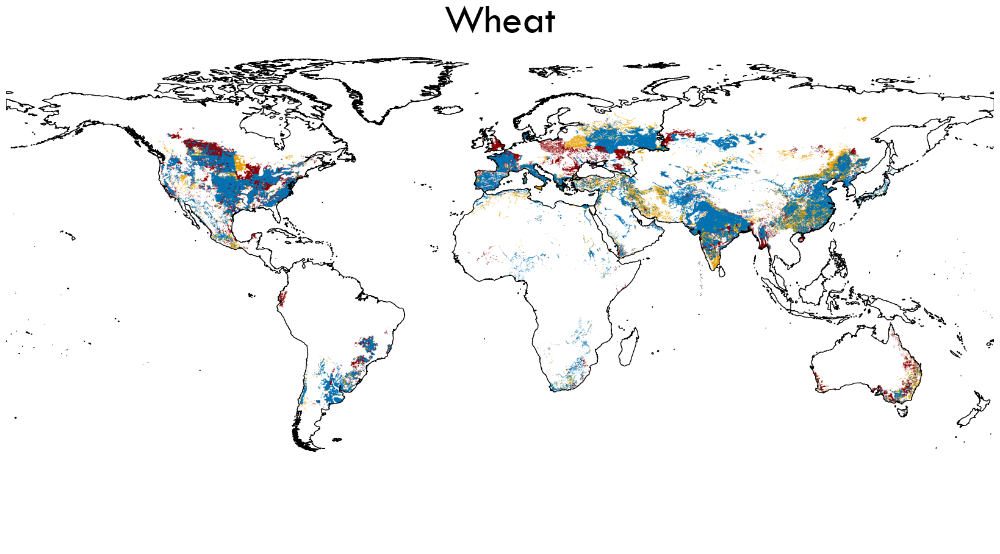

In [69]:
import os
import matplotlib.pyplot as plt
import rasterio
import numpy as np
import geopandas as gpd
from matplotlib import font_manager
from rasterio.warp import reproject, Resampling

# Define colorblind-friendly colors for the plot
dark_blue = '#0072B2'  # Dark Blue for agreement
orange = '#E69F00'  # Orange for MIRCA-OS Only
dark_red = '#8B0000'  # Dark Red for MIRCA2000 Only

# Check if 'Tw Cen MT' font is available
if 'Tw Cen MT' not in [f.name for f in font_manager.fontManager.ttflist]:
    print('The "Tw Cen MT" font is not available on your system. Please use an available font or install "Tw Cen MT".')
    title_font = 'sans-serif'
else:
    title_font = 'Tw Cen MT'

# Function to read raster data
def read_raster(file_path):
    with rasterio.open(file_path) as src:
        return src.read(1), src.transform, src.crs

# Function to reproject and resample raster data to match another raster
def reproject_and_resample(src_data, src_transform, src_crs, dst_shape, dst_transform, dst_crs):
    dst_data = np.zeros(dst_shape, dtype=src_data.dtype)
    reproject(
        source=src_data,
        destination=dst_data,
        src_transform=src_transform,
        src_crs=src_crs,
        dst_transform=dst_transform,
        dst_crs=dst_crs,
        resampling=Resampling.nearest
    )
    return dst_data, dst_transform

# Function to get the extent of a raster from its transform
def get_extent(transform, width, height):
    left = transform[2]
    top = transform[5]
    right = left + transform[0] * width
    bottom = top + transform[4] * height
    return (left, right, bottom, top)

# Function to clean raster data
def clean_raster_data(raster_data, extreme_value_threshold=0):
    cleaned_data = np.where(raster_data < extreme_value_threshold, 0, raster_data)
    cleaned_data = np.where(np.isnan(cleaned_data), 0, cleaned_data)
    return cleaned_data

# Load the shapefile and reproject it to WGS84
shapefile_path = "E:\\Global Shapefiles\\COntinents onlt\\World_Continents.shp"
world = gpd.read_file(shapefile_path)
world = world.to_crs(epsg=4326)

# Directories for raster data
base_dir_os = "E:\\Global Maps\\MIRCA-OS"
base_dir_2000 = "E:\\DOwnscaling\\All_maps\\Global maps\\Maps 2000\\National\\Annual\\Irrigated\\MIRCA2000\\1"

# Crop names
crops = ["Maize", "Rice", "Soybeans", "Wheat"]

# Set up the plot dimensions and resolution
figsize = (20, 10)  # Adjusted to fit the plot nicely
dpi = 100  # Adjust the dpi to your preference for resolution

# Create a plot for each crop
for i, crop in enumerate(crops):
    fig, ax_map = plt.subplots(figsize=figsize, dpi=dpi)
    
    # Read rasters
    raster1, transform1, crs1 = read_raster(f'{base_dir_os}/{crop}.tif')
    raster2, transform2, crs2 = read_raster(f'{base_dir_2000}/{crop}.tif')

    # Reproject rasters to WGS84
    if crs1 != 'EPSG:4326':
        raster1, transform1 = reproject_and_resample(raster1, transform1, crs1, raster1.shape, transform1, 'EPSG:4326')
    if crs2 != 'EPSG:4326':
        raster2, transform2 = reproject_and_resample(raster2, transform2, crs2, raster1.shape, transform1, 'EPSG:4326')

    # Ensure raster2 has the same dimensions as raster1
    raster2_resampled, _ = reproject_and_resample(
        raster2, transform2, crs2, raster1.shape, transform1, 'EPSG:4326'
    )

    # Clean rasters
    raster1 = clean_raster_data(raster1)
    raster2_resampled = clean_raster_data(raster2_resampled)

    # Compare rasters
    agree = (raster1 > 0) & (raster2_resampled > 0)
    mirca_os_only = (raster1 > 0) & (raster2_resampled == 0)
    mirca_2000_only = (raster2_resampled > 0) & (raster1 == 0)

    # Initialize combined RGB array with white background
    combined_rgb = np.ones((raster1.shape[0], raster1.shape[1], 3))

    # Apply new colors based on the comparison
    combined_rgb[agree] = np.array([0, 114, 178]) / 255  # Dark Blue for agreement
    combined_rgb[mirca_os_only] = np.array([230, 159, 0]) / 255  # Orange for MIRCA-OS Only
    combined_rgb[mirca_2000_only] = np.array([139, 0, 0]) / 255  # Dark Red for MIRCA2000 Only

    # Plot map
    extent = get_extent(transform1, raster1.shape[1], raster1.shape[0])
    ax_map.imshow(combined_rgb, extent=extent)
    ax_map.set_title(f'{crop}', fontsize=48, fontname=title_font)  # Increase font size
    ax_map.set_frame_on(False)
    world.boundary.plot(ax=ax_map, linewidth=1, edgecolor='black')

    # Remove x and y ticks
    ax_map.set_xticks([])
    ax_map.set_yticks([])

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the rect parameter to fit your plot and legend inside the figure
    plt.savefig(f'E:\\Global Maps\\Maps\\Anual Maps\\{crop}.png', bbox_inches='tight')

plt.show()


This is a pixle level absolute reltaive difference

Read raster from E:\Global Maps\MIRCA-OS/Maize.tif: min = 0.0, max = 4552.9501953125, mean = 3.0119049549102783
Read raster from E:\DOwnscaling\All_maps\Global maps\Maps 2000\National\Annual\Irrigated\MIRCA2000\1/Maize.tif: min = 0.0, max = 6187.76953125, mean = 3.204380750656128
Maize - CRS1: EPSG:4326, CRS2: EPSG:4326
Debug info for Maize - Raster1: min = 0.009999999776482582, max = 4552.9501953125, mean = 86.00465393066406
Debug info for Maize - Raster2: min = 1.1561950760928936e-16, max = 6187.76953125, mean = 82.9025650024414
ARD for Maize: min = 0.0, max = 100.0
Number of non-NaN pixels in ARD for Maize: 9331200
Read raster from E:\Global Maps\MIRCA-OS/Rice.tif: min = 0.0, max = 11950.2001953125, mean = 10.609415054321289
Read raster from E:\DOwnscaling\All_maps\Global maps\Maps 2000\National\Annual\Irrigated\MIRCA2000\1/Rice.tif: min = 0.0, max = 17388.98046875, mean = 11.051071166992188
Rice - CRS1: EPSG:4326, CRS2: EPSG:4326
Debug info for Rice - Raster1: min = 0.0099999997764

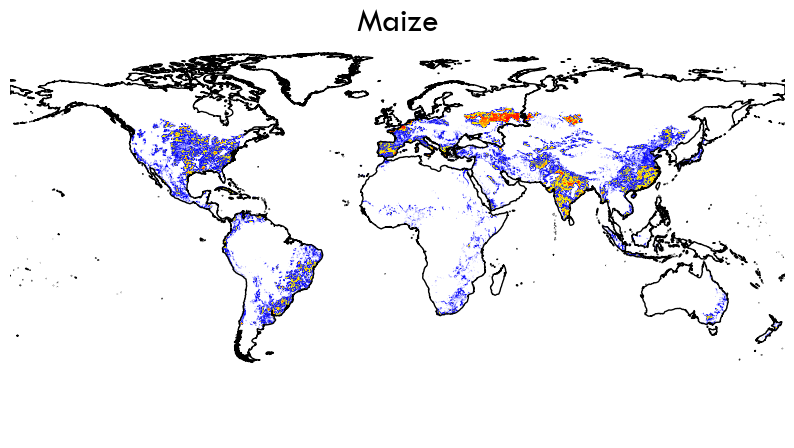

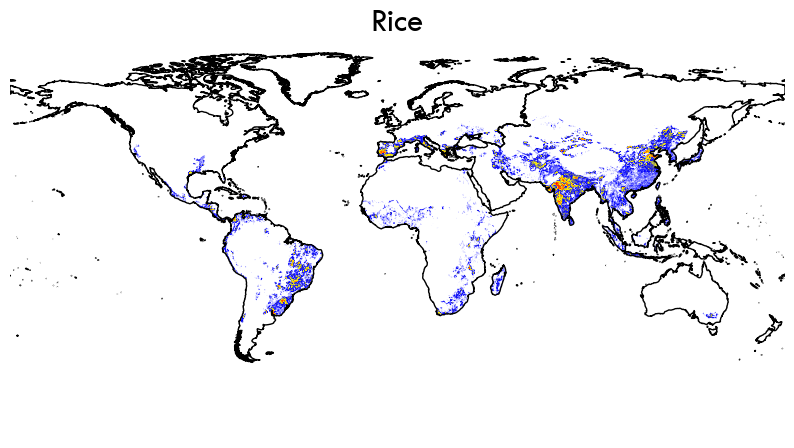

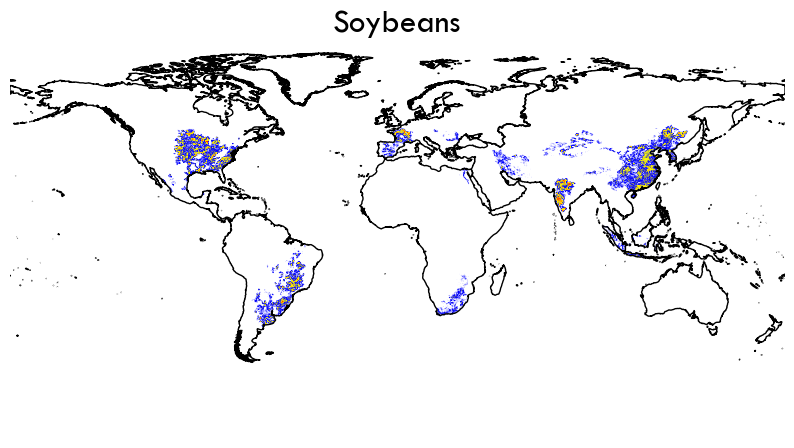

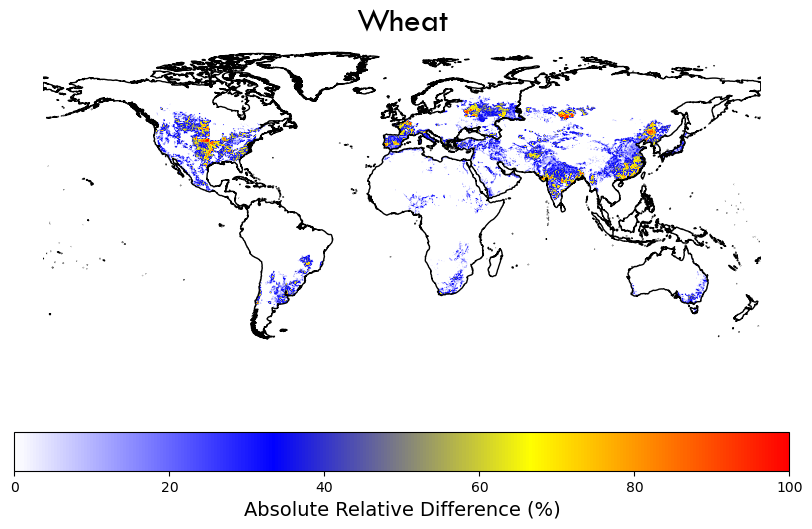

In [54]:
import os
import matplotlib.pyplot as plt
import rasterio
import numpy as np
import geopandas as gpd
from rasterio.warp import reproject, Resampling
from matplotlib import font_manager
import matplotlib.colors as mcolors

# Check if 'Tw Cen MT' font is available
if 'Tw Cen MT' not in [f.name for f in font_manager.fontManager.ttflist]:
    print('The "Tw Cen MT" font is not available on your system. Please use an available font or install "Tw Cen MT".')
    title_font = 'sans-serif'
else:
    title_font = 'Tw Cen MT'

# Function to read raster data
def read_raster(file_path):
    with rasterio.open(file_path) as src:
        raster_data = src.read(1)
        transform = src.transform
        crs = src.crs
        width = src.width
        height = src.height
        # Handle extreme values
        raster_data[raster_data == -3.40282306074e+38] = np.nan
        raster_data[raster_data == -np.inf] = np.nan
        print(f"Read raster from {file_path}: min = {np.nanmin(raster_data)}, max = {np.nanmax(raster_data)}, mean = {np.nanmean(raster_data)}")
        return raster_data, transform, crs, width, height

# Function to reproject and resample raster data to match the reference
def reproject_raster(raster, transform, crs, ref_transform, ref_crs, ref_width, ref_height):
    dst_raster = np.empty((ref_height, ref_width), dtype=raster.dtype)
    reproject(
        source=raster,
        destination=dst_raster,
        src_transform=transform,
        src_crs=crs,
        dst_transform=ref_transform,
        dst_crs=ref_crs,
        resampling=Resampling.bilinear)
    return dst_raster

# Function to get the extent of a raster from its transform
def get_extent(transform, width, height):
    left = transform[2]
    top = transform[5]
    right = left + transform[0] * width
    bottom = top + transform[4] * height
    return (left, right, bottom, top)

# Function to clean raster data
def clean_raster_data(raster_data, threshold=0):
    raster_data[np.isinf(raster_data)] = np.nan
    raster_data[raster_data <= threshold] = np.nan
    return raster_data

# Function to calculate absolute relative difference
def calculate_absolute_relative_difference(raster1, raster2):
    # Ensure no negative values
    raster1 = np.maximum(raster1, 0)
    raster2 = np.maximum(raster2, 0)
    
    max_ras = np.maximum(raster1, raster2)
    with np.errstate(divide='ignore', invalid='ignore'):
        absolute_relative_difference = np.where(max_ras > 0, ((np.abs((raster1 - raster2) / max_ras)) * 100), 0)
    return absolute_relative_difference

# Function to save raster data to a TIFF file
def save_raster(file_path, data, transform, crs):
    with rasterio.open(
        file_path,
        'w',
        driver='GTiff',
        height=data.shape[0],
        width=data.shape[1],
        count=1,
        dtype=data.dtype,
        crs=crs,
        transform=transform,
    ) as dst:
        dst.write(data, 1)

# Load the shapefile
shapefile_path = "E:\\Global Shapefiles\\COntinents onlt\\World_Continents.shp"
world = gpd.read_file(shapefile_path)

# Process rasters
base_dir_os = "E:\\Global Maps\\MIRCA-OS"
base_dir_2000 = "E:\\DOwnscaling\\All_maps\\Global maps\\Maps 2000\\National\\Annual\\Irrigated\\MIRCA2000\\1"

# Crop names
crops = ["Maize", "Rice", "Soybeans", "Wheat"]
# Set up the plot dimensions and resolution
figsize = (10, 6)
dpi = 100  # Adjust the dpi to your preference for resolution

# Create a custom colormap
colors = [(1, 1, 1), (0, 0, 1), (1, 1, 0), (1, 0, 0)]  # white, blue, yellow, red
cmap = mcolors.LinearSegmentedColormap.from_list("custom_cmap", colors, N=256)

# Save individual plots
for crop in crops:
    fig, ax_map = plt.subplots(figsize=figsize, dpi=dpi)
    ax_map.set_facecolor('white')  # Ensure axis background is white

    # Process rasters
    raster1, transform1, crs1, width1, height1 = read_raster(f'{base_dir_os}/{crop}.tif')
    raster2, transform2, crs2, width2, height2 = read_raster(f'{base_dir_2000}/{crop}.tif')

    # Manually set the CRS if missing
    if crs2 is None:
        crs2 = 'EPSG:4326'  # Set the correct CRS if known

    # Print CRS information for debugging
    print(f"{crop} - CRS1: {crs1}, CRS2: {crs2}")

    # Reproject and resample raster2 to match raster1
    raster2_resampled = reproject_raster(raster2, transform2, crs2, transform1, crs1, width1, height1)

    # Clean rasters
    raster1 = clean_raster_data(raster1)
    raster2_resampled = clean_raster_data(raster2_resampled)

    # Print debug information for cleaned rasters
    print(f"Debug info for {crop} - Raster1: min = {np.nanmin(raster1)}, max = {np.nanmax(raster1)}, mean = {np.nanmean(raster1)}")
    print(f"Debug info for {crop} - Raster2: min = {np.nanmin(raster2_resampled)}, max = {np.nanmax(raster2_resampled)}, mean = {np.nanmean(raster2_resampled)}")

    # Calculate absolute relative difference
    absolute_relative_difference = calculate_absolute_relative_difference(raster1, raster2_resampled)

    # Debug output for ARD values
    print(f"ARD for {crop}: min = {np.nanmin(absolute_relative_difference)}, max = {np.nanmax(absolute_relative_difference)}")
    print(f"Number of non-NaN pixels in ARD for {crop}: {np.count_nonzero(~np.isnan(absolute_relative_difference))}")

   # Save the figure as a PNG file
    plt.savefig(f'E:\\Global Maps\\Maps\\relative difference\\relative_difference_{crop}.png', format='png')
    
    # Ensure the shapefile is in the same projection as the raster
    if world.crs != crs1:
        world = world.to_crs(crs1)

    # Plot map
    extent = get_extent(transform1, width1, height1)
    im = ax_map.imshow(absolute_relative_difference, extent=extent, cmap=cmap, vmin=0, vmax=100)
    ax_map.set_title(f'{crop}', fontsize=24, fontname=title_font)
    ax_map.set_frame_on(False)
    world.boundary.plot(ax=ax_map, linewidth=1, edgecolor='black')

    # Remove x and y ticks
    ax_map.set_xticks([])
    ax_map.set_yticks([])

# Add colorbar
cbar = plt.colorbar(im, ax=ax_map, orientation='horizontal', pad=0.05)
cbar.set_label('Absolute Relative Difference (%)', fontsize=14)

plt.show()


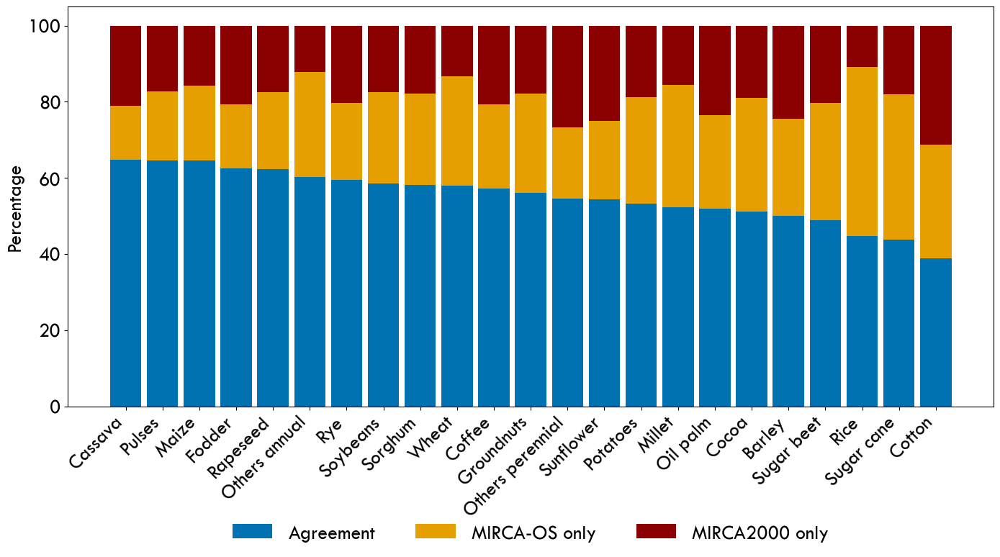

In [205]:
import os
import numpy as np
import matplotlib.pyplot as plt
import rasterio
import geopandas as gpd

# Function to read raster data
def read_raster(file_path):
    with rasterio.open(file_path) as src:
        return src.read(1), src.transform

# Function to compare rasters and return presence/absence data
def compare_rasters(raster1, raster2):
    agree = (raster1 > 0) & (raster2 > 0)
    mirca_os_only = (raster1 > 0) & (raster2 == 0)
    mirca_2000_only = (raster1 == 0) & (raster2 > 0)
    return agree, mirca_os_only, mirca_2000_only

# Function to clean raster data
def clean_raster_data(raster_data, no_data_value=0):
    # Replace extreme negative and positive values, and NaN values with no_data_value
    cleaned_data = np.where((raster_data < 0) | (raster_data > 1e+38) | np.isnan(raster_data), no_data_value, raster_data)
    return cleaned_data

# Function to calculate agreement percentages for the bar chart based on counts
def calculate_percentages(agree, mirca_os_only, mirca_2000_only):
    agree_count = np.sum(agree)
    mirca_os_only_count = np.sum(mirca_os_only)
    mirca_2000_only_count = np.sum(mirca_2000_only)
    total_valid_pixels = agree_count + mirca_os_only_count + mirca_2000_only_count
    agree_pct = (agree_count / total_valid_pixels) * 100 if total_valid_pixels > 0 else 0
    mirca_os_only_pct = (mirca_os_only_count / total_valid_pixels) * 100 if total_valid_pixels > 0 else 0
    mirca_2000_only_pct = (mirca_2000_only_count / total_valid_pixels) * 100 if total_valid_pixels > 0 else 0
    return agree_pct, mirca_os_only_pct, mirca_2000_only_pct

# Directories for raster data
base_dir_os = "E:\\DOwnscaling\\All_maps\\Global maps\\Maps 2000\\National\\Annual\\Rainfed\\MIRCA-OS\\All"
base_dir_2000 = "E:\\DOwnscaling\\All_maps\\Global maps\\Maps 2000\\National\\Annual\\Rainfed\\MIRCA2000\\new"

# Store crop percentages in a dictionary
crop_percentages = {}

# Iterate over the files in the directories
for file_name in os.listdir(base_dir_os):
    if file_name in os.listdir(base_dir_2000):
        crop = os.path.splitext(file_name)[0]
        
        # Read and clean raster data
        raster1, transform1 = read_raster(os.path.join(base_dir_os, file_name))
        raster2, transform2 = read_raster(os.path.join(base_dir_2000, file_name))
        raster1 = clean_raster_data(raster1)
        raster2 = clean_raster_data(raster2)
        
        # Compare rasters and calculate percentages
        agree, mirca_os_only, mirca_2000_only = compare_rasters(raster1, raster2)
        agree_pct, mirca_os_only_pct, mirca_2000_only_pct = calculate_percentages(agree, mirca_os_only, mirca_2000_only)
        
        # Store the percentages for each crop
        crop_percentages[crop] = (agree_pct, mirca_os_only_pct, mirca_2000_only_pct)

# Sort crops by agreement percentage in descending order
sorted_crops = sorted(crop_percentages.items(), key=lambda item: item[1][0], reverse=True)

# Unpack sorted data for plotting
crops, percentages = zip(*sorted_crops)
agreement, mirca_os, mirca_2000 = zip(*percentages)

# Plot stacked bar chart
fig, ax = plt.subplots(figsize=(14, 8))
bar_width = 0.85
indices = np.arange(len(crops))

# Stacked bars
ax.bar(indices, agreement, bar_width, label='Agreement', color='#0072B2')
ax.bar(indices, mirca_os, bar_width, bottom=agreement, label='MIRCA-OS only', color='#E69F00')
ax.bar(indices, mirca_2000, bar_width, bottom=np.array(agreement) + np.array(mirca_os), label='MIRCA2000 only', color='#8B0000')

# Formatting the plot
# ax.set_xlabel('Crops', fontsize=20, fontname='Tw Cen MT')
ax.set_ylabel('Percentage', fontsize=20, fontname='Tw Cen MT')
ax.set_xticks(indices)
ax.set_xticklabels(crops, rotation=45, ha="right", fontsize=20, fontname='Tw Cen MT')

# Set y-ticks font size
plt.yticks(fontsize=20, fontname='Tw Cen MT')

# Adjust legend position, size, and remove the border
legend = ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.25), shadow=False, ncol=3, prop={'size': 20, 'family': 'Tw Cen MT'})
legend.get_frame().set_edgecolor('none')  # Ensure the border is removed
# Show the plot
plt.tight_layout()
plt.savefig('E:\\DOwnscaling\\All_maps\\Validation\\Maps\\Sctter plot\\Irrigated\\All_barchart_rainfed.png', bbox_inches='tight')
plt.show()


This line of code is to perform  a pixle level hexagonal analysis

Crop: Barley, Number of valid data points: 138279
Crop: Cassava, Number of valid data points: 16639
Crop: Cocoa, Number of valid data points: 1852
Crop: Coffee, Number of valid data points: 16200
Crop: Cotton, Number of valid data points: 108701
Crop: Fodder, Number of valid data points: 195377
Crop: Groundnuts, Number of valid data points: 79434
Crop: Maize, Number of valid data points: 252540
Crop: Millet, Number of valid data points: 70484
Crop: Oil palm, Number of valid data points: 393
Crop: Others annual, Number of valid data points: 332580
Crop: Others perennial, Number of valid data points: 188586
Crop: Potatoes, Number of valid data points: 230871
Crop: Pulses, Number of valid data points: 165845
Crop: Rapeseed, Number of valid data points: 30959
Crop: Rice, Number of valid data points: 164212
Crop: Rye, Number of valid data points: 93963
Crop: Sorghum, Number of valid data points: 106173
Crop: Soybeans, Number of valid data points: 125932
Crop: Sugar beet, Number of valid dat

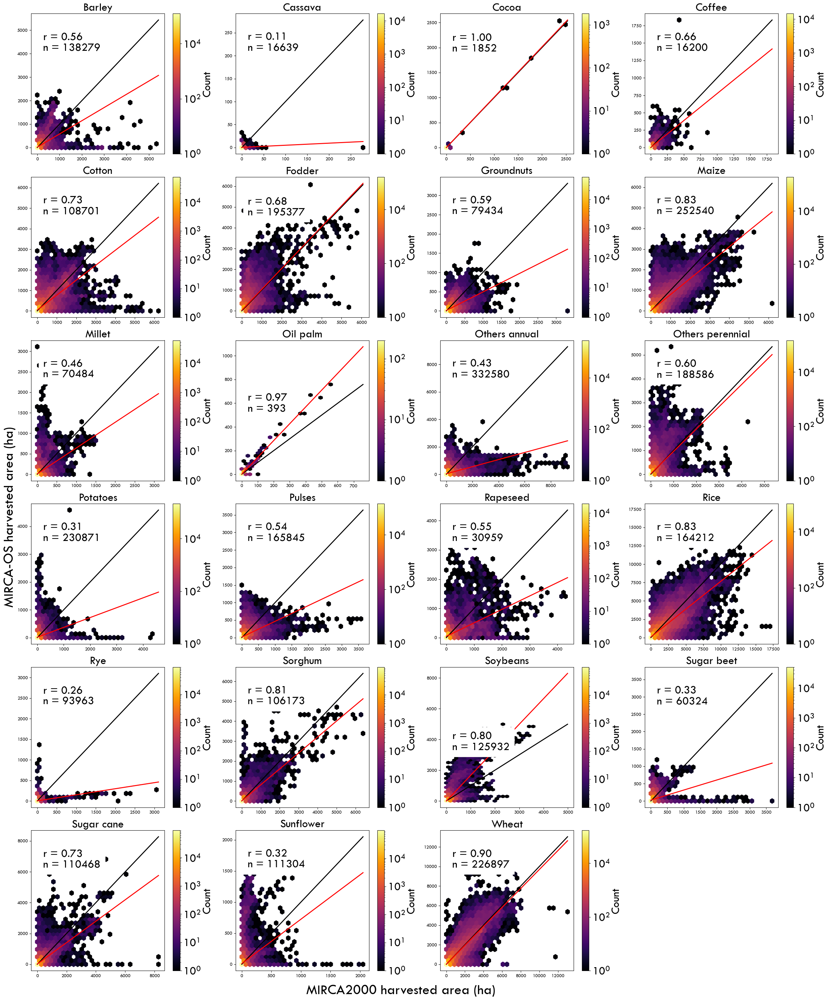

In [19]:
import os
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from scipy.stats import linregress, pearsonr

# Set the font family globally for all plots
plt.rcParams['font.family'] = 'Tw Cen MT'

# Define the base font size
font_size = 24

# Define the clean_raster_data function
def clean_raster_data(raster_data, nan_value):
    """
    Replace the given NaN value in raster data with actual NaNs and zero for negative values.
    """
    raster_data = np.where(raster_data == nan_value, np.nan, raster_data)
    return np.where((raster_data < 0), np.nan, raster_data)

# Define the plot_scatter_and_regression function
def plot_scatter_and_regression(ax, x, y, crop_name, n_valid, common_min, common_max):
    mask = (x != nan_value) & (y != nan_value)
    x = x[mask]
    y = y[mask]
    
    # Calculate the Pearson correlation coefficient
    r, _ = pearsonr(x, y)

    # Create a hexbin plot 
    hb = ax.hexbin(x, y, gridsize=30, cmap='inferno', bins='log', extent=(common_min, common_max, common_min, common_max))
    cbar = ax.figure.colorbar(hb, ax=ax, label='Count')
    cbar.ax.tick_params(labelsize=font_size)  # Set the fontsize for colorbar ticks
    cbar.set_label('Count', size=font_size)  # Set the fontsize for colorbar label

    # Add the 1:1 line
    ax.plot([common_min, common_max], [common_min, common_max], color='black', linestyle='-', linewidth=2)

    # Perform linear regression
    slope, intercept = linregress(x, y)[:2]
    ax.plot([common_min, common_max], [intercept + slope * common_min, intercept + slope * common_max], color='red', linewidth=2)

    # Add text annotation in the plot
    text_x = common_min + (common_max - common_min) * 0.05
    text_y = common_max - (common_max - common_min) * 0.1
    ax.text(text_x, text_y, f'r = {r:.2f}\nn = {n_valid}', color='black', ha='left', va='top', backgroundcolor='white', fontsize=font_size)

    # Set title
    ax.set_title(f'{crop_name}', fontsize=font_size)


# Define the paths to the directories
folder1 = "E:\\DOwnscaling\\All_maps\\Global maps\\Maps 2000\\National\\Annual\\Irrigated\\MIRCA2000\\new"
folder2 = "E:\\DOwnscaling\\All_maps\\Global maps\\Maps 2000\\National\\Annual\\Irrigated\\MIRCA-OS\\new"
# Create a 4x6 subplot layout
fig, axs = plt.subplots(6, 4, figsize=(25, 30))
axs = axs.ravel()

# List the raster files
rasters1 = {os.path.splitext(file)[0]: os.path.join(folder1, file) for file in os.listdir(folder1) if file.endswith('.tif')}
rasters2 = {os.path.splitext(file)[0]: os.path.join(folder2, file) for file in os.listdir(folder2) if file.endswith('.tif')}

# Define the NaN value
nan_value = 0

# Iterate over the rasters to plot the data
for i, (crop_name, raster_path1) in enumerate(rasters1.items()):
    if i >= 23:
        break  # Stop after 23 crops
    raster_path2 = rasters2.get(crop_name)
    if raster_path2:
        with rasterio.open(raster_path1) as src1, rasterio.open(raster_path2) as src2:
            # Read the data and apply the cleaning function
            data1 = clean_raster_data(src1.read(1), nan_value)
            data2 = clean_raster_data(src2.read(1), nan_value)

            # Flatten the arrays to create a 1D array for each
            data1 = data1.flatten()
            data2 = data2.flatten()

            # Filter out invalid data points
            valid_mask = (data1 >= 0) & (data2 >= 0)
            data1 = data1[valid_mask]
            data2 = data2[valid_mask]

            # Remove NaN values from both datasets
            mask = ~np.isnan(data1) & ~np.isnan(data2)
            data1 = data1[mask]
            data2 = data2[mask]

            # Calculate the number of valid data points for this crop
            n_valid = len(data1)
            print(f'Crop: {crop_name}, Number of valid data points: {n_valid}')  # Debugging statement

            # Find the min and max values for the current crop
            common_min = min(np.nanmin(data1), np.nanmin(data2))
            common_max = max(np.nanmax(data1), np.nanmax(data2))

            # Find the next available subplot
            ax = axs[i]

            # Plot the data on the corresponding subplot axis
            plot_scatter_and_regression(ax, data1, data2, crop_name, n_valid, common_min, common_max)
            
# Hide the last plot (24th plot)
axs[-1].axis('off')

# Set common x and y labels
fig.text(0.5, 0.04, 'MIRCA2000 harvested area (ha)', ha='center', fontsize=30)
fig.text(0.04, 0.5, 'MIRCA-OS harvested area (ha)', va='center', rotation='vertical', fontsize=30)

# Adjust the layout and display the plot
plt.tight_layout(rect=[0.05, 0.05, 1, 1])  # Adjust rect to fit common labels
plt.savefig(f'E:DOwnscaling\\All_maps\\Validation\\Maps\\Sctter plot\\Irrigated\\All_ir.png', bbox_inches='tight')
plt.show()


Crop: Barley, Number of valid data points: 138279
Crop: Cassava, Number of valid data points: 16639
Crop: Cocoa, Number of valid data points: 1852
Crop: Coffee, Number of valid data points: 16200
Crop: Cotton, Number of valid data points: 108701
Crop: Fodder, Number of valid data points: 195377
Crop: Groundnuts, Number of valid data points: 79434
Crop: Maize, Number of valid data points: 252540
Crop: Millet, Number of valid data points: 70484
Crop: Oil palm, Number of valid data points: 393
Crop: Others annual, Number of valid data points: 332580
Crop: Others perennial, Number of valid data points: 188586
Crop: Potatoes, Number of valid data points: 230871
Crop: Pulses, Number of valid data points: 165845
Crop: Rapeseed, Number of valid data points: 30959
Crop: Rice, Number of valid data points: 164212
Crop: Rye, Number of valid data points: 93963
Crop: Sorghum, Number of valid data points: 106173
Crop: Soybeans, Number of valid data points: 125932
Crop: Sugar beet, Number of valid dat

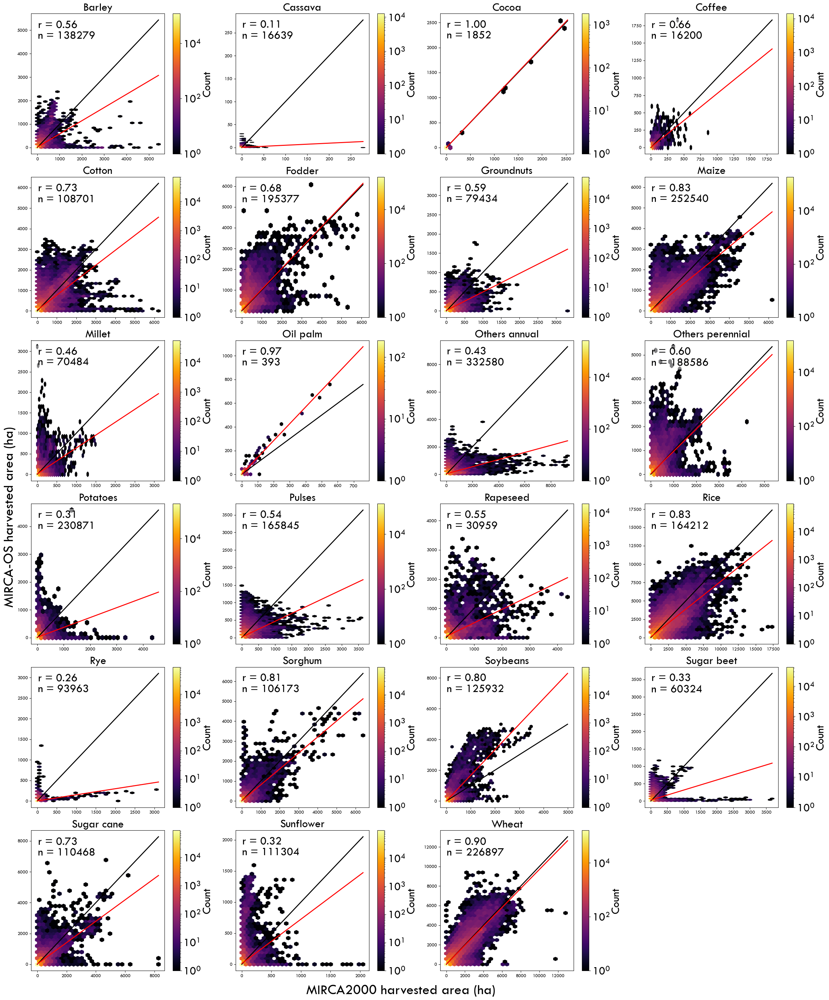

In [11]:
import os
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from scipy.stats import linregress, pearsonr

# Set the font family globally for all plots
plt.rcParams['font.family'] = 'Tw Cen MT'

# Define the base font size
font_size = 24

# Define the clean_raster_data function
def clean_raster_data(raster_data, nan_value):
    """
    Replace the given NaN value in raster data with actual NaNs and zero for negative values.
    """
    raster_data = np.where(raster_data == nan_value, np.nan, raster_data)
    return np.where((raster_data < 0), np.nan, raster_data)

# Define the plot_scatter_and_regression function
def plot_scatter_and_regression(ax, x, y, crop_name, n_valid):
    mask = (x != nan_value) & (y != nan_value)
    x = x[mask]
    y = y[mask]
    
    # Calculate the Pearson correlation coefficient
    r, _ = pearsonr(x, y)

    # Create a hexbin plot 
    hb = ax.hexbin(x, y, gridsize=30, cmap='inferno', bins='log')
    cbar = ax.figure.colorbar(hb, ax=ax, label='Count')
    cbar.ax.tick_params(labelsize=font_size)  # Set the fontsize for colorbar ticks
    cbar.set_label('Count', size=font_size)  # Set the fontsize for colorbar label

    # Add the 1:1 line
    min_val = min(x.min(), y.min())
    max_val = max(x.max(), y.max())
    ax.plot([min_val, max_val], [min_val, max_val], color='black', linestyle='-', linewidth=2)

    # Perform linear regression
    slope, intercept = linregress(x, y)[:2]
    ax.plot([min_val, max_val], [intercept + slope * min_val, intercept + slope * max_val], color='red', linewidth=2)

    # Add text annotation in the plot (upper left corner, transparent background)
    text_x = 0.05
    text_y = 0.95
    ax.text(text_x, text_y, f'r = {r:.2f}\nn = {n_valid}', transform=ax.transAxes, color='black', ha='left', va='top', fontsize=font_size, bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

    # Set title
    ax.set_title(f'{crop_name}', fontsize=font_size)


# Define the paths to the directories
folder1 = "E:\\DOwnscaling\\All_maps\\Global maps\\Maps 2000\\National\\Annual\\Irrigated\\MIRCA2000\\new"
folder2 = "E:\\DOwnscaling\\All_maps\\Global maps\\Maps 2000\\National\\Annual\\Irrigated\\MIRCA-OS\\new"
# Create a 4x6 subplot layout
fig, axs = plt.subplots(6, 4, figsize=(25, 30))
axs = axs.ravel()

# List the raster files
rasters1 = {os.path.splitext(file)[0]: os.path.join(folder1, file) for file in os.listdir(folder1) if file.endswith('.tif')}
rasters2 = {os.path.splitext(file)[0]: os.path.join(folder2, file) for file in os.listdir(folder2) if file.endswith('.tif')}

# Define the NaN value
nan_value = 0

# Iterate over the rasters to plot the data
for i, (crop_name, raster_path1) in enumerate(rasters1.items()):
    if i >= 23:
        break  # Stop after 23 crops
    raster_path2 = rasters2.get(crop_name)
    if raster_path2:
        with rasterio.open(raster_path1) as src1, rasterio.open(raster_path2) as src2:
            # Read the data and apply the cleaning function
            data1 = clean_raster_data(src1.read(1), nan_value)
            data2 = clean_raster_data(src2.read(1), nan_value)

            # Flatten the arrays to create a 1D array for each
            data1 = data1.flatten()
            data2 = data2.flatten()

            # Filter out invalid data points
            valid_mask = (data1 >= 0) & (data2 >= 0)
            data1 = data1[valid_mask]
            data2 = data2[valid_mask]

            # Remove NaN values from both datasets
            mask = ~np.isnan(data1) & ~np.isnan(data2)
            data1 = data1[mask]
            data2 = data2[mask]

            # Calculate the number of valid data points for this crop
            n_valid = len(data1)
            print(f'Crop: {crop_name}, Number of valid data points: {n_valid}')  # Debugging statement

            # Find the next available subplot
            ax = axs[i]

            # Plot the data on the corresponding subplot axis
            plot_scatter_and_regression(ax, data1, data2, crop_name, n_valid)
            
# Hide the last plot (24th plot)
axs[-1].axis('off')

# Set common x and y labels
fig.text(0.5, 0.04, 'MIRCA2000 harvested area (ha)', ha='center', fontsize=30)
fig.text(0.04, 0.5, 'MIRCA-OS harvested area (ha)', va='center', rotation='vertical', fontsize=30)

# Adjust the layout and display the plot
plt.tight_layout(rect=[0.05, 0.05, 1, 1])  # Adjust rect to fit common labels
plt.savefig(f'E:DOwnscaling\\All_maps\\Validation\\Maps\\Sctter plot\\Irrigated\\All_ir.png', bbox_inches='tight')
plt.show()


Crop: Barley, Number of valid data points: 367981
Crop: Cassava, Number of valid data points: 322957
Crop: Cocoa, Number of valid data points: 120372
Crop: Coffee, Number of valid data points: 241374
Crop: Cotton, Number of valid data points: 270862
Crop: Fodder, Number of valid data points: 437862
Crop: Groundnuts, Number of valid data points: 357243
Crop: Maize, Number of valid data points: 611720
Crop: Millet, Number of valid data points: 301743
Crop: Oil palm, Number of valid data points: 160294
Crop: Others annual, Number of valid data points: 607243
Crop: Others perennial, Number of valid data points: 392293
Crop: Potatoes, Number of valid data points: 476084
Crop: Pulses, Number of valid data points: 653941
Crop: Rapeseed, Number of valid data points: 375364
Crop: Rice, Number of valid data points: 263343
Crop: Rye, Number of valid data points: 273113
Crop: Sorghum, Number of valid data points: 450695
Crop: Soybeans, Number of valid data points: 437304
Crop: Sugar beet, Number o

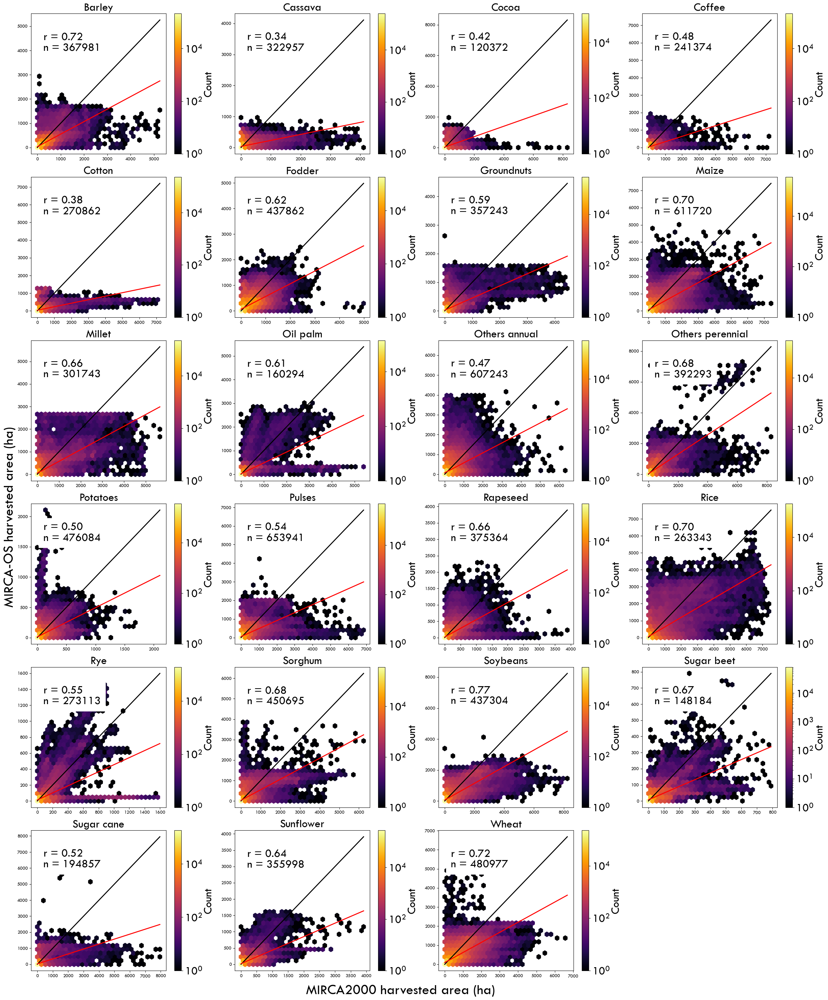

In [14]:
import os
import numpy as np
import matplotlib.pyplot as plt
import rasterio
from scipy.stats import linregress, pearsonr

# Set the font family globally for all plots
plt.rcParams['font.family'] = 'Tw Cen MT'

# Define the base font size
font_size = 24

# Define the clean_raster_data function
def clean_raster_data(raster_data, nan_value):
    """
    Replace the given NaN value in raster data with actual NaNs and zero for negative values.
    """
    raster_data = np.where(raster_data == nan_value, np.nan, raster_data)
    return np.where((raster_data < 0), np.nan, raster_data)

# Define the plot_scatter_and_regression function
def plot_scatter_and_regression(ax, x, y, crop_name, n_valid, common_min, common_max):
    mask = (x != nan_value) & (y != nan_value)
    x = x[mask]
    y = y[mask]
    
    # Calculate the Pearson correlation coefficient
    r, _ = pearsonr(x, y)

    # Create a hexbin plot 
    hb = ax.hexbin(x, y, gridsize=30, cmap='inferno', bins='log', extent=(common_min, common_max, common_min, common_max))
    cbar = ax.figure.colorbar(hb, ax=ax, label='Count')
    cbar.ax.tick_params(labelsize=font_size)  # Set the fontsize for colorbar ticks
    cbar.set_label('Count', size=font_size)  # Set the fontsize for colorbar label

    # Add the 1:1 line
    ax.plot([common_min, common_max], [common_min, common_max], color='black', linestyle='-', linewidth=2)

    # Perform linear regression
    slope, intercept = linregress(x, y)[:2]
    ax.plot([common_min, common_max], [intercept + slope * common_min, intercept + slope * common_max], color='red', linewidth=2)

    # Add text annotation in the plot
    text_x = common_min + (common_max - common_min) * 0.05
    text_y = common_max - (common_max - common_min) * 0.1
    ax.text(text_x, text_y, f'r = {r:.2f}\nn = {n_valid}', color='black', ha='left', va='top', backgroundcolor='white', fontsize=font_size)

    # Set title
    ax.set_title(f'{crop_name}', fontsize=font_size)


# Define the paths to the directories
folder1 = "E:\\DOwnscaling\\All_maps\\Global maps\\Maps 2000\\National\\Annual\\Rainfed\\MIRCA2000\\new"
folder2 = "E:\\DOwnscaling\\All_maps\\Global maps\\Maps 2000\\National\\Annual\\Rainfed\\MIRCA-OS\\new"
# Create a 4x6 subplot layout
fig, axs = plt.subplots(6, 4, figsize=(25, 30))
axs = axs.ravel()

# List the raster files
rasters1 = {os.path.splitext(file)[0]: os.path.join(folder1, file) for file in os.listdir(folder1) if file.endswith('.tif')}
rasters2 = {os.path.splitext(file)[0]: os.path.join(folder2, file) for file in os.listdir(folder2) if file.endswith('.tif')}

# Define the NaN value
nan_value = 0

# Iterate over the rasters to plot the data
for i, (crop_name, raster_path1) in enumerate(rasters1.items()):
    if i >= 23:
        break  # Stop after 23 crops
    raster_path2 = rasters2.get(crop_name)
    if raster_path2:
        with rasterio.open(raster_path1) as src1, rasterio.open(raster_path2) as src2:
            # Read the data and apply the cleaning function
            data1 = clean_raster_data(src1.read(1), nan_value)
            data2 = clean_raster_data(src2.read(1), nan_value)

            # Flatten the arrays to create a 1D array for each
            data1 = data1.flatten()
            data2 = data2.flatten()

            # Filter out invalid data points
            valid_mask = (data1 >= 0) & (data2 >= 0)
            data1 = data1[valid_mask]
            data2 = data2[valid_mask]

            # Remove NaN values from both datasets
            mask = ~np.isnan(data1) & ~np.isnan(data2)
            data1 = data1[mask]
            data2 = data2[mask]

            # Calculate the number of valid data points for this crop
            n_valid = len(data1)
            print(f'Crop: {crop_name}, Number of valid data points: {n_valid}')  # Debugging statement

            # Find the min and max values for the current crop
            common_min = min(np.nanmin(data1), np.nanmin(data2))
            common_max = max(np.nanmax(data1), np.nanmax(data2))

            # Find the next available subplot
            ax = axs[i]

            # Plot the data on the corresponding subplot axis
            plot_scatter_and_regression(ax, data1, data2, crop_name, n_valid, common_min, common_max)
            
# Hide the last plot (24th plot)
axs[-1].axis('off')

# Set common x and y labels
fig.text(0.5, 0.04, 'MIRCA2000 harvested area (ha)', ha='center', fontsize=30)
fig.text(0.04, 0.5, 'MIRCA-OS harvested area (ha)', va='center', rotation='vertical', fontsize=30)

# Adjust the layout and display the plot
plt.tight_layout(rect=[0.05, 0.05, 1, 1])  # Adjust rect to fit common labels
plt.savefig(f'E:DOwnscaling\\All_maps\\Validation\\Maps\\Sctter plot\\Rainfed\\All_rf.png', bbox_inches='tight')
plt.show()


This cell si for ploting annual harvested area of major irrigated crops 

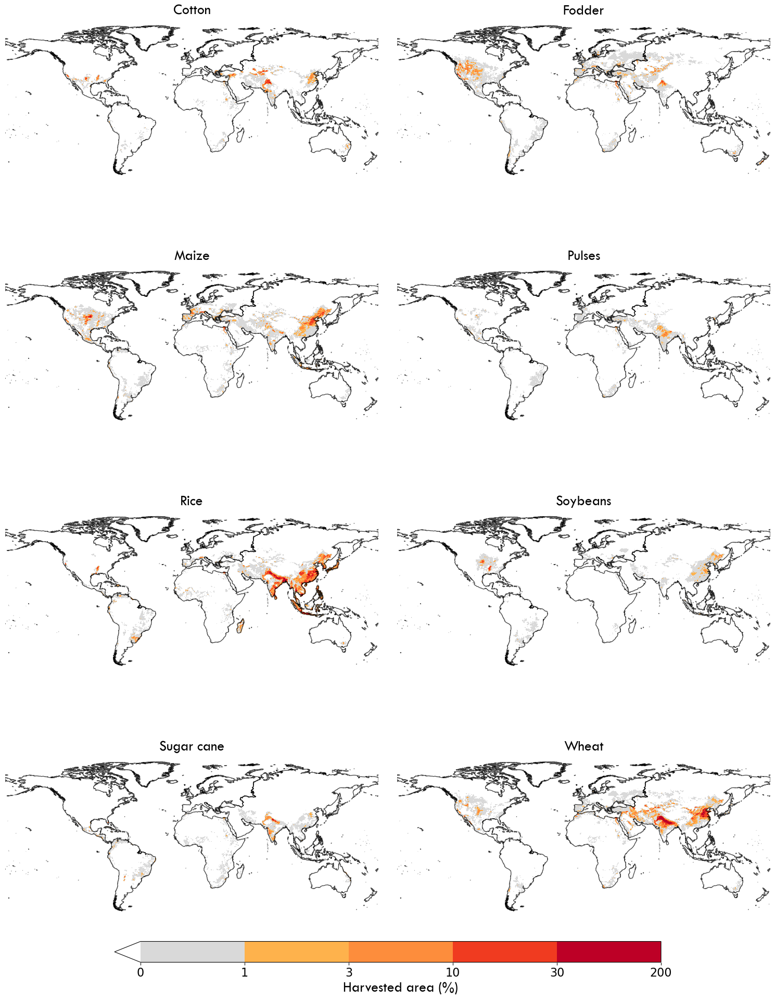

In [5]:
import geopandas as gpd
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm, ListedColormap
import numpy as np

def clean_raster_data(raster_data, extreme_value_threshold=0):
    # Replace extreme values with NaN
    raster_data = np.where(raster_data < extreme_value_threshold, 0, raster_data)
    raster_data = np.where(np.isinf(raster_data), 0, raster_data)
    return raster_data

# Paths to your data
shapefile_path = "E:\\Global Shapefiles\\COntinents onlt\\World_Continents.shp"
crop_tif_paths = {
    'Cotton': "E:\\Global Maps\\2000\\Irrigated\\Cotton.tif",
    'Fodder': "E:\\Global Maps\\2000\\Irrigated\\Fodder.tif",
    'Maize': "E:\\Global Maps\\2000\\Irrigated\\Maize.tif",
    'Pulses': "E:\\Global Maps\\2000\\Irrigated\\Pulses.tif",
    'Rice': "E:\\Global Maps\\2000\\Irrigated\\Rice.tif",
    'Soybeans': "E:\\Global Maps\\2000\\Irrigated\\Soybeans.tif",
    'Sugar cane': "E:\\Global Maps\\2000\\Irrigated\\Sugar cane.tif",
    'Wheat': "E:\\Global Maps\\2000\\Irrigated\\Wheat.tif"
}

# Load the shapefile
world = gpd.read_file(shapefile_path)

# Ensure the shapefile projection is WGS84
if world.crs != "EPSG:4326":
    world = world.to_crs("EPSG:4326")

# Define the updated color map and bounds
colors = ['#d9d9d9', '#feb24c', '#fd8d3c', '#f03b20', '#bd0026']
bounds = [0.01, 1, 3, 10, 30, 200]
cmap = ListedColormap(colors)
norm = BoundaryNorm(bounds, cmap.N)

# Create a figure and axes
fig, axs = plt.subplots(4, 2, figsize=(15, 20), subplot_kw={'aspect': 'equal'})
axs = axs.ravel()

# Plot each crop map
for ax, (crop, tif_path) in zip(axs, crop_tif_paths.items()):
    with rasterio.open(tif_path) as src:
        # Ensure the raster projection is WGS84
        if src.crs != "EPSG:4326":
            raise ValueError(f"The raster file {tif_path} is not in WGS84 projection.")
        
        # Read the data and mask transparency
        data = src.read(1, masked=True)
        
        # Clean the raster data by removing extreme values and handling NaN and inf
        cleaned_data = clean_raster_data(data, extreme_value_threshold=0)
        
        # Explicitly set the bounds
        bounds = src.bounds
        extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
        
        # Plot the raster data
        img = ax.imshow(cleaned_data, cmap=cmap, norm=norm, extent=extent, origin='upper')
        
        # Plot zero and NaN values as white
        img.cmap.set_under('white')
        
        # Plot the shapefile boundaries
        world.boundary.plot(ax=ax, linewidth=1, color='black', alpha=0.7)
        
        ax.set_title(crop, fontsize=20, fontname='Tw Cen MT')  # Reduced title font size
        ax.set_axis_off()

# Adjust the space between subplots
fig.subplots_adjust(left=0.01, right=0.99, top=0.95, bottom=0.01, wspace=0.05, hspace=0.01)

# Add a colorbar with custom tick labels
cbar_ax = fig.add_axes([0.15, 0.02, 0.7, 0.02])  # Adjusted colorbar position and height
cbar = plt.colorbar(img, cax=cbar_ax, orientation='horizontal', extend='min')
cbar.set_label('Harvested area (%)', fontsize=20, fontname='Tw Cen MT')  # Adjusted font size
cbar.ax.tick_params(labelsize=16)  # Set the tick label size
cbar.set_ticks([0.01, 1, 3, 10, 30, 200])
cbar.set_ticklabels([ "0",'1', '3', '10', '30', '200'])

# Save and show the figure
plt.savefig('E:\\DOwnscaling\\Annual Mpas Python\\Irrigated\\irrgated_maps.png', dpi=300, bbox_inches='tight')
plt.show()


This cell si for ploting annual harvested area of major irrigated crops

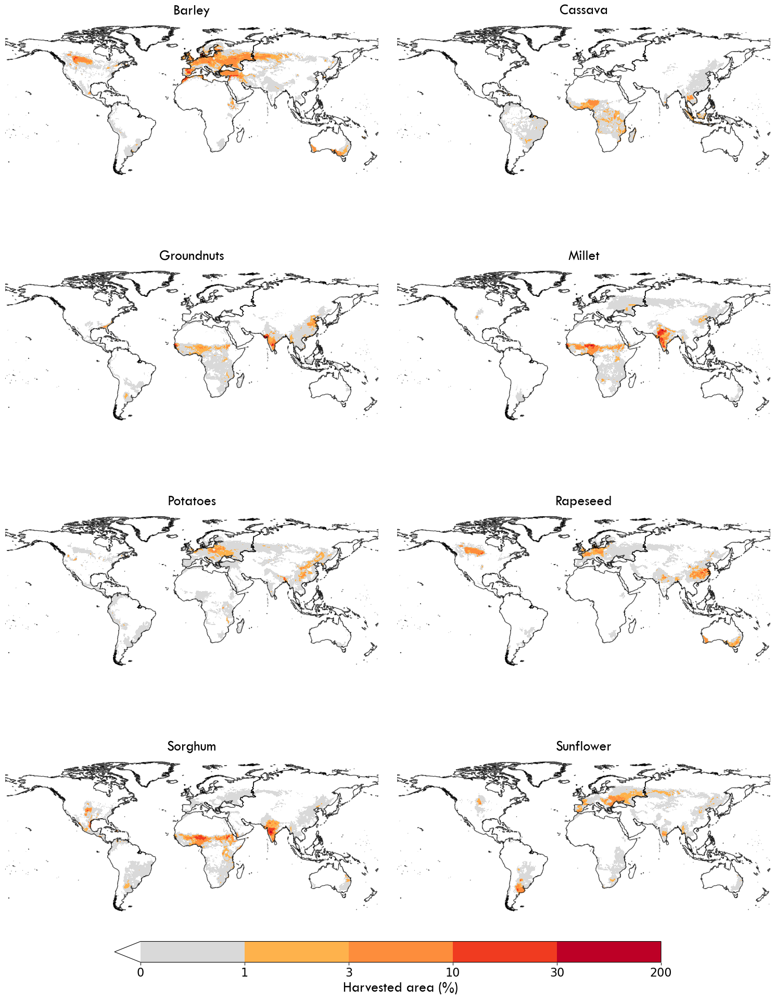

In [7]:
import geopandas as gpd
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm, ListedColormap
import numpy as np

def clean_raster_data(raster_data, extreme_value_threshold=0):
    # Replace extreme values with NaN
    raster_data = np.where(raster_data < extreme_value_threshold, 0, raster_data)
    raster_data = np.where(np.isinf(raster_data), 0, raster_data)
    return raster_data

# Paths to your data
shapefile_path = "E:\\Global Shapefiles\\COntinents onlt\\World_Continents.shp"
crop_tif_paths = {
    'Barley': "E:\\Global Maps\\2000\\Rainfed\\Barley.tif",
    'Cassava': "E:\\Global Maps\\2000\\Rainfed\\Cassava.tif",
    'Groundnuts': "E:\\Global Maps\\2000\\Rainfed\\Groundnuts.tif",
    'Millet': "E:\\Global Maps\\2000\\Rainfed\\Millet.tif",
    'Potatoes': "E:\\Global Maps\\2000\\Rainfed\\Potatoes.tif",
    'Rapeseed': "E:\\Global Maps\\2000\\Rainfed\\Rapeseed.tif",
    'Sorghum': "E:\\Global Maps\\2000\\Rainfed\\Sorghum.tif",
    'Sunflower': "E:\\Global Maps\\2000\\Rainfed\\Sunflower.tif"
}


# Load the shapefile
world = gpd.read_file(shapefile_path)

# Ensure the shapefile projection is WGS84
if world.crs != "EPSG:4326":
    world = world.to_crs("EPSG:4326")

# Define the updated color map and bounds
colors = ['#d9d9d9', '#feb24c', '#fd8d3c', '#f03b20', '#bd0026']
bounds = [0.01, 1, 3, 10, 30, 200]
cmap = ListedColormap(colors)
norm = BoundaryNorm(bounds, cmap.N)

# Create a figure and axes
fig, axs = plt.subplots(4, 2, figsize=(15, 20), subplot_kw={'aspect': 'equal'})
axs = axs.ravel()

# Plot each crop map
for ax, (crop, tif_path) in zip(axs, crop_tif_paths.items()):
    with rasterio.open(tif_path) as src:
        # Ensure the raster projection is WGS84
        if src.crs != "EPSG:4326":
            raise ValueError(f"The raster file {tif_path} is not in WGS84 projection.")
        
        # Read the data and mask transparency
        data = src.read(1, masked=True)
        
        # Clean the raster data by removing extreme values and handling NaN and inf
        cleaned_data = clean_raster_data(data, extreme_value_threshold=0)
        
        # Explicitly set the bounds
        bounds = src.bounds
        extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
        
        # Plot the raster data
        img = ax.imshow(cleaned_data, cmap=cmap, norm=norm, extent=extent, origin='upper')
        
        # Plot zero and NaN values as white
        img.cmap.set_under('white')
        
        # Plot the shapefile boundaries
        world.boundary.plot(ax=ax, linewidth=1, color='black', alpha=0.7)
        
        ax.set_title(crop, fontsize=20, fontname='Tw Cen MT')  # Reduced title font size
        ax.set_axis_off()

# Adjust the space between subplots
fig.subplots_adjust(left=0.01, right=0.99, top=0.95, bottom=0.01, wspace=0.05, hspace=0.01)

# Add a colorbar with custom tick labels
cbar_ax = fig.add_axes([0.15, 0.02, 0.7, 0.02])  # Adjusted colorbar position and height
cbar = plt.colorbar(img, cax=cbar_ax, orientation='horizontal', extend='min')
cbar.set_label('Harvested area (%)', fontsize=20, fontname='Tw Cen MT')  # Adjusted font size
cbar.ax.tick_params(labelsize=16)  # Set the tick label size
cbar.set_ticks([0.01, 1, 3, 10, 30, 200])
cbar.set_ticklabels([ "0",'1', '3', '10', '30', '200'])

# Save and show the figure
# Save and show the figure
plt.savefig('E:\\DOwnscaling\\Annual Mpas Python\\Rainfed\\rainfed_maps.png', dpi=300, bbox_inches='tight')
plt.show()



In [ ]:
This cell is to plot a monthly groiwng area of major crops for a slected four months

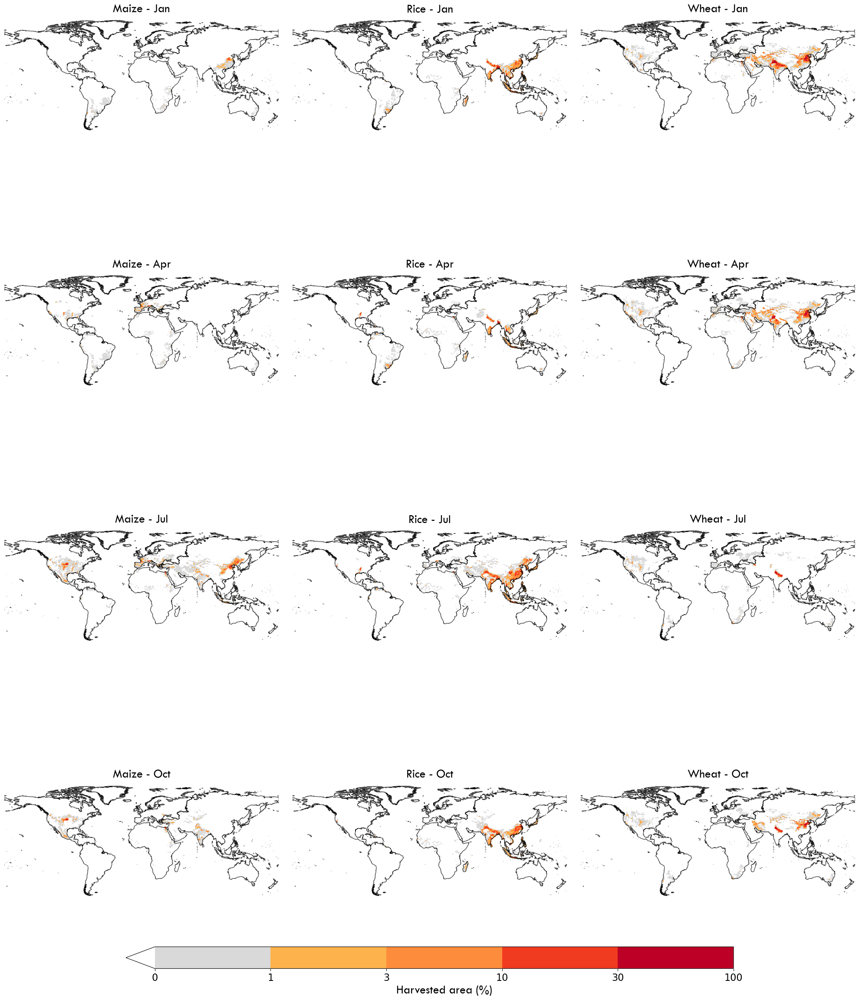

In [10]:
import os
import matplotlib.pyplot as plt
import geopandas as gpd
from matplotlib.colors import ListedColormap, BoundaryNorm
import rasterio
import numpy as np

def clean_raster_data(data, extreme_value_threshold=-3.40282306074e+38):
    # Mask extreme values and handle NaN and inf
    data = np.where(data <= extreme_value_threshold, 0, data)
    return data

# Load the shapefile
shapefile_path = "E:\\Global Shapefiles\\COntinents onlt\\World_Continents.shp"
world = gpd.read_file(shapefile_path)

# Ensure the shapefile projection is WGS84
if world.crs != "EPSG:4326":
    world = world.to_crs("EPSG:4326")

# Define the updated color map and bounds
colors = ['#d9d9d9', '#feb24c', '#fd8d3c', '#f03b20', '#bd0026']
bounds = [0.01, 1, 3, 10, 30, 200]
cmap = ListedColormap(colors)
norm = BoundaryNorm(bounds, cmap.N)

# Define the root folder and the crops
root_folder = "D:\\PhD_Udel\\MICRA_2015\\DOwnscaling\\All_maps\\Global maps\\Maps 2000\\New National\\Months"
months = ['Jan', 'Apr', 'Jul', 'Oct']
crops = ['Maize', 'Rice', 'Wheat']

# Create a figure and axes
fig, axs = plt.subplots(4, 3, figsize=(20, 25), subplot_kw={'aspect': 'equal'})
axs = axs.ravel()

# Loop through each month and crop to plot the raster files
for i, (month, crop) in enumerate([(m, c) for m in months for c in crops]):
    tif_path = os.path.join(root_folder, month, f"{crop}.tif")
    
    with rasterio.open(tif_path) as src:
        # Ensure the raster projection is WGS84
        if src.crs != "EPSG:4326":
            raise ValueError(f"The raster file {tif_path} is not in WGS84 projection.")
        
        # Read the data and mask transparency
        data = src.read(1, masked=True)
        
        # Clean the raster data by removing extreme values and handling NaN and inf
        cleaned_data = clean_raster_data(data, extreme_value_threshold=0)
        
        # Explicitly set the bounds
        bounds = src.bounds
        extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]
        
        # Plot the raster data
        img = axs[i].imshow(cleaned_data, cmap=cmap, norm=norm, extent=extent, origin='upper')
        
        # Plot zero and NaN values as white
        img.cmap.set_under('white')
        
        # Plot the shapefile boundaries
        world.boundary.plot(ax=axs[i], linewidth=1, color='black', alpha=0.7)
        
        # Set titles
        axs[i].set_title(f"{crop} - {month}", fontsize=20, fontname='Tw Cen MT')
        axs[i].set_axis_off()

# Adjust the space between subplots
fig.subplots_adjust(left=0.01, right=0.99, top=0.95, bottom=0.01, wspace=0.05, hspace=0)

# Add a colorbar with custom tick labels
cbar_ax = fig.add_axes([0.15, 0.02, 0.7, 0.02])
cbar = plt.colorbar(img, cax=cbar_ax, orientation='horizontal', extend='min')
cbar.set_label('Harvested area (%)', fontsize=20, fontname='Tw Cen MT')
cbar.ax.tick_params(labelsize=16)
cbar.set_ticks([0.01, 1, 3, 10, 30, 200])
cbar.set_ticklabels(['0', '1', '3', '10', '30', '100'])

# Save and show the figure
plt.savefig('E:\\Global Maps\\Maps\\Monthly maps\\monthly_maps.png', dpi=300, bbox_inches='tight')
plt.show()


The folowing code cells are for ploting teh adiministrative boudnaries of spataial units used to develop MIRCA-OS dataset

C:\Users\endal\AppData\Local\Temp\ipykernel_18560\2119056588.py:17: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


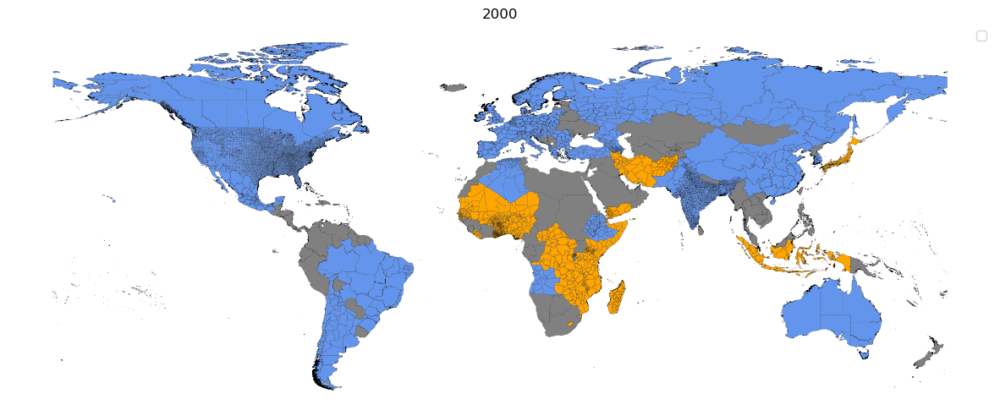

In [10]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load the shapefile
shapefile_path = "E:\\Global Shapefiles\\Merged\\merged_2000.shp"
gdf = gpd.read_file(shapefile_path)

# Create a plot
fig, ax = plt.subplots(figsize=(15, 10))  # Adjusted figsize for better visualization

# Plotting the different admin levels with colorblind-friendly colors
gdf[gdf['Adminlevel'] == 1].plot(ax=ax, color='orange', edgecolor='black', linewidth=0.1, label='Subnational level (only few crops)')
gdf[gdf['Adminlevel'] == 2].plot(ax=ax, color='cornflowerblue', edgecolor='black', linewidth=0.1, label='Subnational level (all crops)')
gdf[(gdf['Adminlevel'] != 1) & (gdf['Adminlevel'] != 2)].plot(ax=ax, color='gray', edgecolor='black', linewidth=0.1, label='National level')

# Adding the legend
handles, labels = ax.get_legend_handles_labels()
unique_labels = dict(zip(labels, handles))
ax.legend(unique_labels.values(), unique_labels.keys(), loc='upper right')

# Adding the title
plt.title("2000")

# Removing axis for better visualization
ax.set_axis_off()

# Save and show the plot
plt.savefig('E:\\Global Shapefiles\\Merged\\admin_levels_map_2000.png', dpi=300, bbox_inches='tight')
plt.show()


C:\Users\endal\AppData\Local\Temp\ipykernel_18560\1750085507.py:17: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


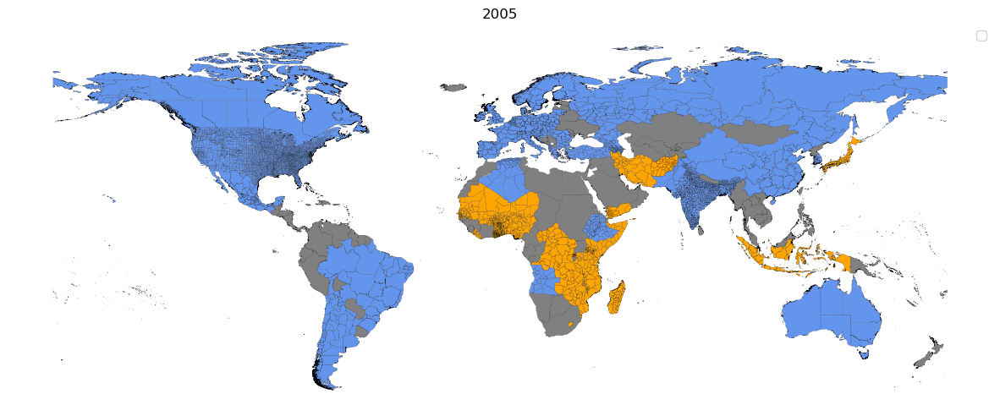

In [11]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load the shapefile
shapefile_path = "E:\\Global Shapefiles\\Merged\\merged_2005.shp"
gdf = gpd.read_file(shapefile_path)

# Create a plot
fig, ax = plt.subplots(figsize=(15, 10))  # Adjusted figsize for better visualization

# Plotting the different admin levels with colorblind-friendly colors
gdf[gdf['Adminlevel'] == 1].plot(ax=ax, color='orange', edgecolor='black', linewidth=0.1, label='Subnational level (only few crops)')
gdf[gdf['Adminlevel'] == 2].plot(ax=ax, color='cornflowerblue', edgecolor='black', linewidth=0.1, label='Subnational level (all crops)')
gdf[(gdf['Adminlevel'] != 1) & (gdf['Adminlevel'] != 2)].plot(ax=ax, color='gray', edgecolor='black', linewidth=0.1, label='National level')

# Adding the legend
handles, labels = ax.get_legend_handles_labels()
unique_labels = dict(zip(labels, handles))
ax.legend(unique_labels.values(), unique_labels.keys(), loc='upper right')

# Adding the title
plt.title("2005")

# Removing axis for better visualization
ax.set_axis_off()

# Save and show the plot
plt.savefig('E:\\Global Shapefiles\\Merged\\admin_levels_map_2005.png', dpi=300, bbox_inches='tight')
plt.show()


C:\Users\endal\AppData\Local\Temp\ipykernel_18560\676344870.py:17: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


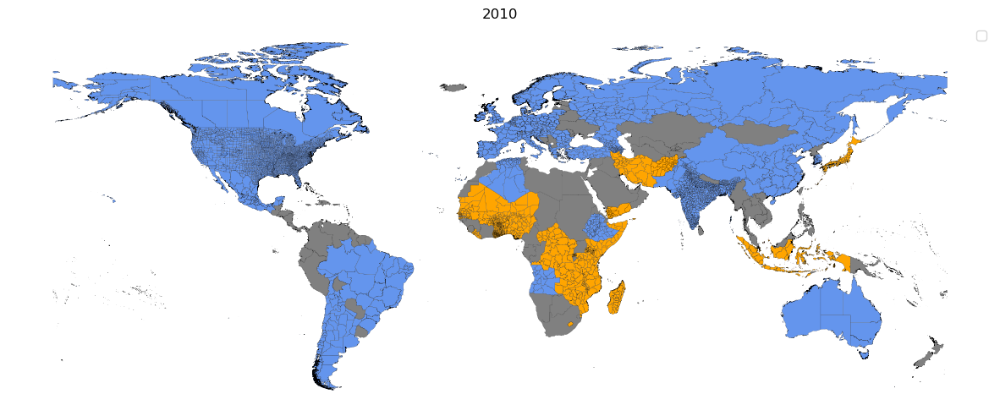

In [12]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load the shapefile
shapefile_path = "E:\\Global Shapefiles\\Merged\\merged_2010.shp"
gdf = gpd.read_file(shapefile_path)

# Create a plot
fig, ax = plt.subplots(figsize=(15, 10))  # Adjusted figsize for better visualization

# Plotting the different admin levels with colorblind-friendly colors
gdf[gdf['Adminlevel'] == 1].plot(ax=ax, color='orange', edgecolor='black', linewidth=0.1, label='Subnational level (only few crops)')
gdf[gdf['Adminlevel'] == 2].plot(ax=ax, color='cornflowerblue', edgecolor='black', linewidth=0.1, label='Subnational level (all crops)')
gdf[(gdf['Adminlevel'] != 1) & (gdf['Adminlevel'] != 2)].plot(ax=ax, color='gray', edgecolor='black', linewidth=0.1, label='National level')

# Adding the legend
handles, labels = ax.get_legend_handles_labels()
unique_labels = dict(zip(labels, handles))
ax.legend(unique_labels.values(), unique_labels.keys(), loc='upper right')

# Adding the title
plt.title("2010")

# Removing axis for better visualization
ax.set_axis_off()

# Save and show the plot
plt.savefig('E:\\Global Shapefiles\\Merged\\admin_levels_map_2010.png', dpi=300, bbox_inches='tight')
plt.show()


C:\Users\endal\AppData\Local\Temp\ipykernel_18560\1266760810.py:17: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  handles, labels = ax.get_legend_handles_labels()


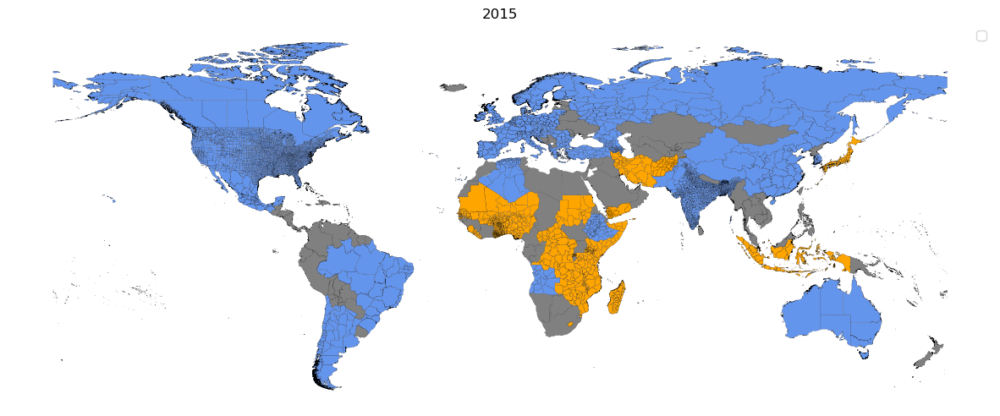

In [13]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Load the shapefile
shapefile_path = "E:\\Global Shapefiles\\Merged\\merged_2015.shp"
gdf = gpd.read_file(shapefile_path)

# Create a plot
fig, ax = plt.subplots(figsize=(15, 10))  # Adjusted figsize for better visualization

# Plotting the different admin levels with colorblind-friendly colors
gdf[gdf['Adminlevel'] == 1].plot(ax=ax, color='orange', edgecolor='black', linewidth=0.1, label='Subnational level (only few crops)')
gdf[gdf['Adminlevel'] == 2].plot(ax=ax, color='cornflowerblue', edgecolor='black', linewidth=0.1, label='Subnational level (all crops)')
gdf[(gdf['Adminlevel'] != 1) & (gdf['Adminlevel'] != 2)].plot(ax=ax, color='gray', edgecolor='black', linewidth=0.1, label='National level')

# Adding the legend
handles, labels = ax.get_legend_handles_labels()
unique_labels = dict(zip(labels, handles))
ax.legend(unique_labels.values(), unique_labels.keys(), loc='upper right')

# Adding the title
plt.title("2015")

# Removing axis for better visualization
ax.set_axis_off()

# Save and show the plot
plt.savefig('E:\\Global Shapefiles\\Merged\\admin_levels_map_2015.png', dpi=300, bbox_inches='tight')
plt.show()


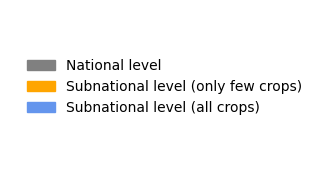

In [14]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Create a dummy figure and axis for the legend
fig, ax = plt.subplots(figsize=(4, 2))  # Adjust figsize as needed

# Create patches as legend handles
patch1 = mpatches.Patch(color='gray', label='National level')
patch2 = mpatches.Patch(color='orange', label='Subnational level (only few crops)')
patch3 = mpatches.Patch(color='cornflowerblue', label='Subnational level (all crops)')

# Create legend
legend = ax.legend(handles=[patch1, patch2, patch3], loc='center', frameon=False)

# Remove axis
ax.axis('off')

# Save legend as a separate PNG file
plt.savefig('E:\\Global Shapefiles\\Merged\\legend.png', dpi=300, bbox_inches='tight')
plt.show()
